In [1]:
import warnings
warnings.filterwarnings('ignore')
# Import libraries
import glob
%matplotlib inline
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.offline as pyo
import itertools
import plotly.io as pio

from sklearn.model_selection import train_test_split, StratifiedShuffleSplit, cross_val_score

from sklearn.preprocessing import OrdinalEncoder, StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline

# For seasonal decomposition
from statsmodels.tsa.seasonal import seasonal_decompose, STL
# Import additional functions needed
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import SGDRegressor, BayesianRidge
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import accuracy_score as acc
from sklearn.metrics import make_scorer, confusion_matrix
from sklearn.dummy import DummyRegressor, DummyClassifier

from sklearn.decomposition import PCA, KernelPCA


In [2]:
months_of_the_year = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Loading the Data

In [3]:
#storing all the csv file names in a list
csv_files = glob.glob(r'.\weatherdata_for_students\brighton*.csv')

# Reading each CSV file into DataFrame from this list
isFirst = True
for file in csv_files:
    if isFirst == True:
        df = pd.read_csv(file)
        isFirst = False
    else:
        df_temp = pd.read_csv(file)
        # applying check to skip first row if not header 
        skip_row = 1 if df_temp.iloc[0,0] == 'datetime' else 0  
        df = pd.concat([df, pd.read_csv(file,skiprows=skip_row)], ignore_index=True)
df['datetime']=pd.to_datetime(df['datetime'])
df['year'] = df['datetime'].dt.year
df['month'] = df['datetime'].dt.month
df['day'] = df['datetime'].dt.day
df['hour'] = df['datetime'].dt.hour
df['week_of_year'] = df['datetime'].dt.isocalendar().week

# checking to see how final data looks        
# print(df)
df.to_csv(r'.\aggregated_data.csv')


In [4]:
print(df['datetime'].min(), df['datetime'].max())

2010-01-01 00:00:00 2024-01-06 11:00:00


# Understanding the data

In [5]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122844 entries, 0 to 122843
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   datetime          122844 non-null  datetime64[ns]
 1   temp              122590 non-null  float64       
 2   dew               122568 non-null  float64       
 3   humidity          122575 non-null  float64       
 4   precip            122565 non-null  float64       
 5   precipprob        122558 non-null  float64       
 6   preciptype        11277 non-null   object        
 7   snow              89810 non-null   float64       
 8   snowdepth         89279 non-null   float64       
 9   windspeed         122583 non-null  float64       
 10  winddir           122567 non-null  float64       
 11  sealevelpressure  122319 non-null  float64       
 12  cloudcover        122556 non-null  float64       
 13  solarradiation    122514 non-null  float64       
 14  sola

Apart from datetime column, all other columns have missing values especially in preciptype

In [6]:
df.head()

,datetime,temp,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windspeed,...,sealevelpressure,cloudcover,solarradiation,solarenergy,uvindex,year,month,day,hour,week_of_year
0,2010-01-01 00:00:00,1.9,-0.5,84.25,0.417,100.0,"rain,snow",0.0,0.0,19.4,...,999.9,62.2,0.0,0.0,0.0,2010,1,1,0,53
1,2010-01-01 01:00:00,1.9,-0.5,83.90,0.000,0.0,NaN,0.0,0.0,21.8,...,999.8,22.4,0.0,0.0,0.0,2010,1,1,1,53
2,2010-01-01 02:00:00,1.4,-0.7,85.76,0.000,0.0,NaN,0.0,0.0,17.7,...,1000.0,38.0,0.0,0.0,0.0,2010,1,1,2,53
3,2010-01-01 03:00:00,1.4,-0.7,85.69,0.000,0.0,NaN,0.0,0.0,18.0,...,1000.2,66.7,0.0,0.0,0.0,2010,1,1,3,53
4,2010-01-01 04:00:00,1.3,-0.8,85.72,0.000,0.0,NaN,0.0,0.0,17.4,...,1000.5,62.8,0.0,0.0,0.0,2010,1,1,4,53


In [7]:
df.describe()

,datetime,temp,dew,humidity,precip,precipprob,snow,snowdepth,windspeed,winddir,sealevelpressure,cloudcover,solarradiation,solarenergy,uvindex,year,month,day,hour,week_of_year
count,122844,122590.000000,122568.000000,122575.000000,122565.000000,122558.000000,89810.000000,89279.000000,122583.000000,122567.000000,122319.000000,122556.000000,122514.000000,122480.000000,122486.000000,122844.000000,122844.000000,122844.000000,122844.000000,122844.0
mean,2017-01-03 06:05:12.103155200,11.059431,8.047911,82.880536,0.081954,8.883141,0.000408,0.028941,15.938294,196.561486,1015.525463,60.841873,138.575974,0.498450,1.368646,2016.507766,6.518235,15.715013,11.499414,26.564106
min,2010-01-01 00:00:00,-9.100000,-11.600000,24.340000,0.000000,0.000000,0.000000,0.000000,0.000000,0.700000,955.000000,0.000000,0.000000,0.000000,0.000000,2010.000000,1.000000,1.000000,0.000000,1.0
25%,2013-07-03 15:45:00,7.200000,4.500000,75.560000,0.000000,0.000000,0.000000,0.000000,9.400000,113.000000,1009.600000,36.000000,0.000000,0.000000,0.000000,2013.000000,4.000000,8.000000,5.000000,14.0
50%,2017-01-03 05:30:00,11.000000,8.400000,85.700000,0.000000,0.000000,0.000000,0.000000,14.400000,223.000000,1016.400000,68.400000,9.000000,0.000000,0.000000,2017.000000,7.000000,16.000000,11.000000,27.0
75%,2020-07-05 21:15:00,15.300000,12.000000,92.790000,0.000000,0.000000,0.000000,0.000000,21.300000,267.000000,1022.500000,89.800000,201.000000,0.700000,2.000000,2020.000000,10.000000,23.000000,17.000000,40.0
max,2024-01-06 11:00:00,33.300000,20.200000,100.000000,32.385000,100.000000,7.870000,96.000000,72.200000,360.000000,1049.300000,100.000000,1150.000000,4.100000,10.000000,2024.000000,12.000000,31.000000,23.000000,53.0
std,NaN,5.654195,5.136014,12.511270,0.660720,28.450141,0.034549,0.441740,8.903724,106.273116,10.519485,31.879025,220.733866,0.795407,2.225490,4.036078,3.451485,8.804550,6.922215,15.076368


In [8]:
df.nunique() # checking for duplicates

datetime            122830
temp                   389
dew                    308
humidity              6047
precip                2729
precipprob               2
preciptype               3
snow                    14
snowdepth              129
windspeed              597
winddir                592
sealevelpressure       798
cloudcover            1001
solarradiation        6189
solarenergy             41
uvindex                 11
year                    15
month                   12
day                     31
hour                    24
week_of_year            53
dtype: int64

time series is not all unique

In [9]:
duplicate_rows = df.duplicated()
duplicate_rows_df = df[duplicate_rows]
# Count the number of duplicate rows
num_duplicates = duplicate_rows.sum()
print(f"Number of Duplicate Rows: {num_duplicates}, This implies we have duplicates only for the datetime column which we need to drop" )

Number of Duplicate Rows: 0, This implies we have duplicates only for the datetime column which we need to drop



since duplicate rows are zero, but we saw in previous step that timeseries is not all unique means we have more than 1 row per date value which we have to drop for indexing 

In [10]:
#droping duplicates based on datetime
df = df.drop_duplicates(subset=['datetime']) 
df.set_index('datetime', inplace=True)
print(len(df)) #14 duplicates found

122830


In [11]:
#checking for missing date range
full_index = pd.date_range(start='2010-01-01 00:00:00', end='2024-01-06 11:00:00', freq='H')
missing_indexes = full_index.difference(df.index)
missing_df = pd.DataFrame(index=missing_indexes, columns=df.columns)
print("Number of missing date ranges:", len(pd.DataFrame(index=missing_indexes, columns=df.columns)))
# Concatenating the original DataFrame and the DataFrame with missing indexes
df_combined = pd.concat([df, missing_df])

#Reindexing
df = df_combined.reindex(full_index)
print(len(df))

Number of missing date ranges: 14
122844


In [12]:
print(df['year'].isna().sum()) 

14


All missing range seems to be added.We now seem to have data in continuity without any gaps

In [13]:
num_samples, num_features = df.shape
print(f'samples:{num_samples},features:{num_features}')

samples:122844,features:20


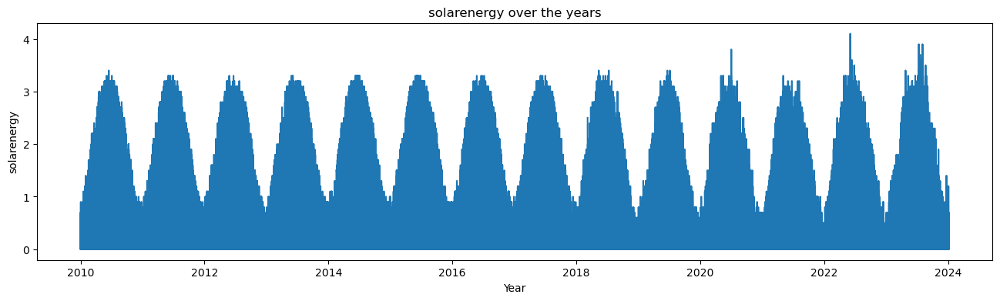

In [14]:
plt.figure(figsize=(16, 4))
plt.plot(df.index,df['solarenergy'])
plt.xlabel('Year')
plt.ylabel('solarenergy')
plt.title('solarenergy over the years')
plt.show()

pyo.init_notebook_mode()
fig = px.line(df,x=df.index,y='solarenergy',title='solar energy variation over the years')
fig.update_xaxes(rangeslider_visible=True)
pio.renderers.default = 'iframe'
fig.show()
fig.write_html("se_variation.html")

Solar energy seems to follow a uniform trend throughout the years with few spikes after 2020.
if we drill down using the slider to view a week's data, then there is uniformity among consecutive days as well, reaching max value during 12pm-2pm

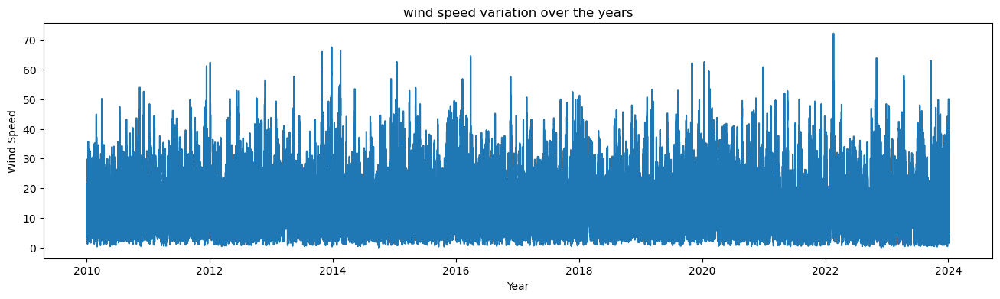

In [15]:
plt.figure(figsize=(16, 4))
plt.plot(df.index,df['windspeed'])
plt.xlabel('Year')
plt.ylabel('Wind Speed')
plt.title('wind speed variation over the years')
plt.show()

pyo.init_notebook_mode()
fig = px.line(df,x=df.index,y='windspeed',title='wind speed variation over the years')
fig.update_xaxes(rangeslider_visible=True)
pio.renderers.default = 'iframe'
fig.show()
fig.write_html("ws_variation.html")

Windspeed seems to be concentrated around its mean

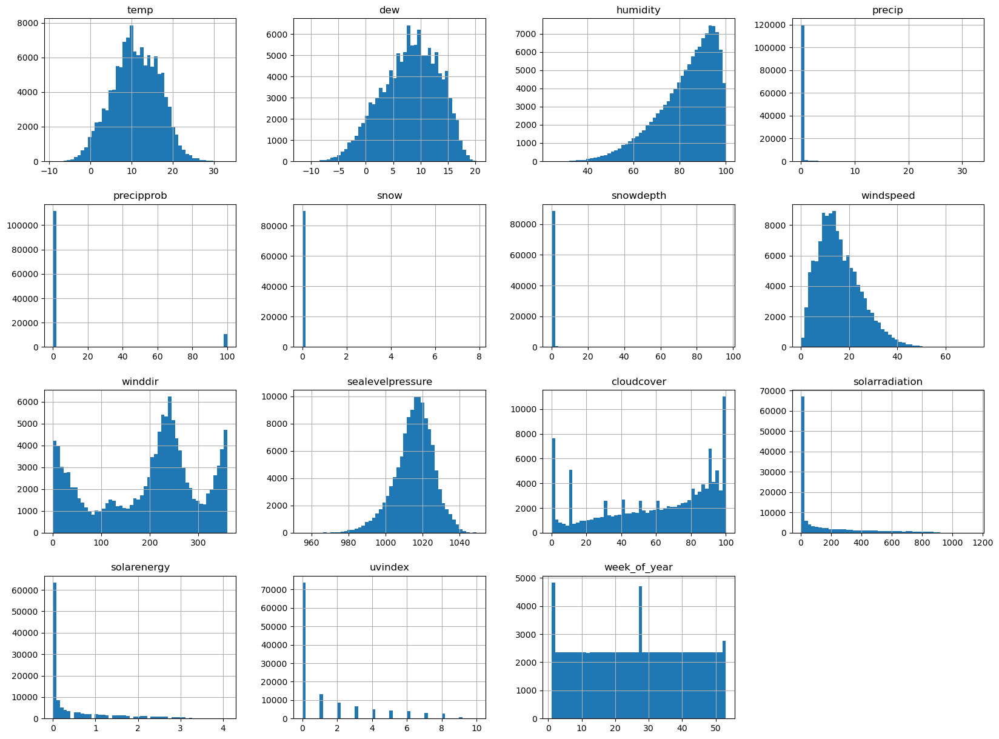

In [16]:
# _ = df.hist(bins=50, figsize=(20,15))

_ = df.hist(bins=50, figsize=(20,15))

Observations made through histogram:
1. temp and dew are bell shaped implying normal distribution 
2. many features like humidity and windspeed are skewed which may require standardisation
3. precip,precipprob,snow,snowdepth are near zero most of the time simultaneously may imply underlying pattern
4. there seems to be some relation between solarradiation and solarenergy


In [17]:
# checking numerically if the relationships hold
correlations = df.loc[:,df.columns!='preciptype'].corr()
correlations['solarenergy'].sort_values(ascending=False)



solarenergy         1.000000
solarradiation      0.999641
uvindex             0.994927
temp                0.460290
dew                 0.230291
windspeed           0.158966
hour                0.104855
sealevelpressure    0.102763
day                -0.000081
snow               -0.003782
snowdepth          -0.026656
precip             -0.036349
month              -0.043552
winddir            -0.044540
week_of_year       -0.047491
precipprob         -0.061407
year               -0.062611
cloudcover         -0.158252
humidity           -0.538034
Name: solarenergy, dtype: float64

solarenergy,solarradiation & uvindex do have a linear relation , checking for dew

In [18]:
correlations['dew'].sort_values(ascending=False)

dew                 1.000000
temp                0.891728
month               0.328153
week_of_year        0.324570
solarradiation      0.230318
solarenergy         0.230291
uvindex             0.229173
cloudcover          0.107747
windspeed           0.092103
humidity            0.085033
year                0.060702
precipprob          0.057349
precip              0.047649
hour                0.047596
winddir             0.034906
day                 0.028739
snow               -0.024055
sealevelpressure   -0.100649
snowdepth          -0.120273
Name: dew, dtype: float64

# Exploring more with Time series

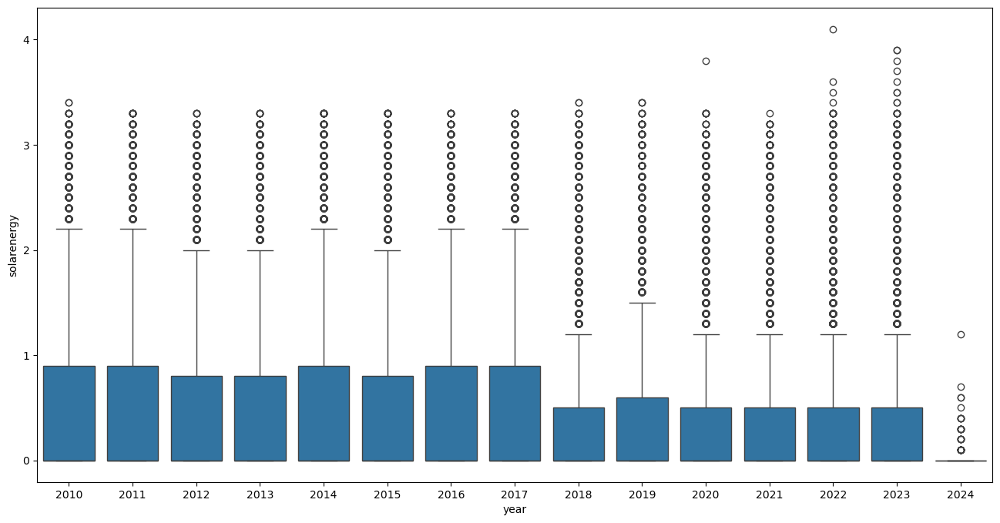

In [19]:
# solar energy boxplot
plt.figure(figsize=(16, 8))
_=sns.boxplot(x='year', y='solarenergy', data=df)
# _=plt.tight_layout()
_=plt.savefig('./solrenergy_boxplot.pdf', dpi=1000)

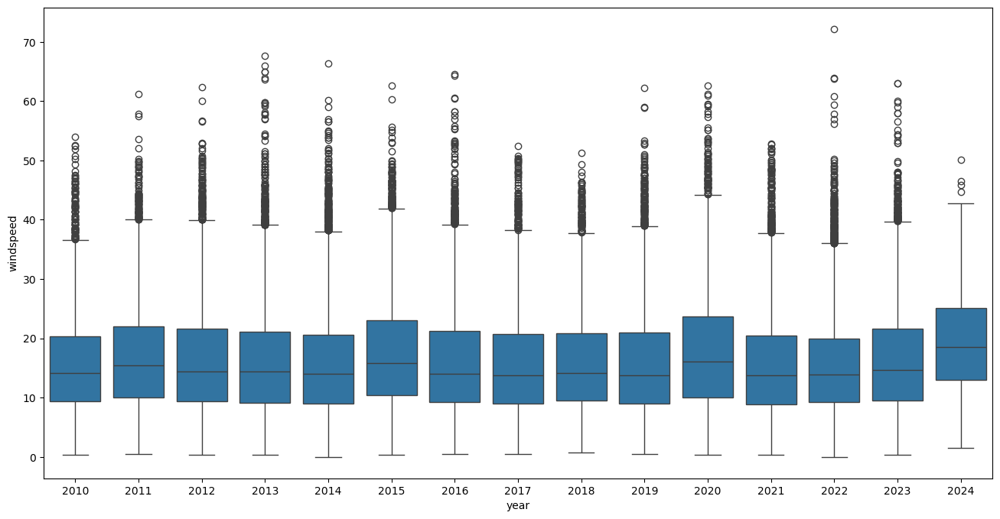

In [20]:
# wind energy boxplot
plt.figure(figsize=(16, 8))
_=sns.boxplot(x='year', y='windspeed', data=df)
# _=plt.tight_layout()
_=plt.savefig('./solrenergy_boxplot.pdf', dpi=1000)

A lot of outliers can be seen for solar energy and windspeed

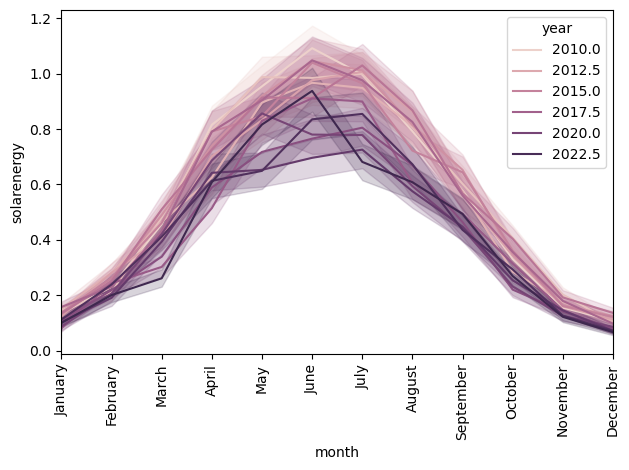

In [21]:
# Visualise trends across years for solarenergy
sns.lineplot(x='month', y='solarenergy', data=df, hue='year')
_=plt.xticks(np.arange(1, 13), months_of_the_year, rotation=90)
_=plt.xlim(1, 12)  # limit x-axis
_=plt.tight_layout()
_=plt.savefig('./trend_lineplot.pdf', dpi=1000)


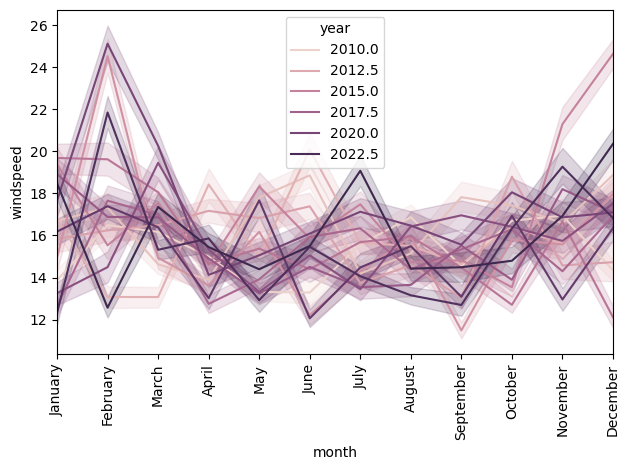

In [22]:
# Visualise trends across years for windspeed
sns.lineplot(x='month', y='windspeed', data=df, hue='year')
_=plt.xticks(np.arange(1, 13), months_of_the_year, rotation=90)
_=plt.xlim(1, 12)  # limit x-axis
_=plt.tight_layout()
_=plt.savefig('./trend_lineplot.pdf', dpi=1000)

It can be seen:
trend for every year is almost same for solar energy(goes up reaches max value and then decreases), whereas for windspeed values vary but mostly stay within a range.

In [23]:
# Time series decomposition for solar energy
data_ds_se = df['solarenergy'].resample('M').mean().ffill().to_frame()
data_ds_se

,solarenergy
2010-01-31,0.134724
2010-02-28,0.230402
2010-03-31,0.456545
2010-04-30,0.815481
2010-05-31,0.954043
...,...
2023-09-30,0.493494
2023-10-31,0.269324
2023-11-30,0.122284
2023-12-31,0.066667


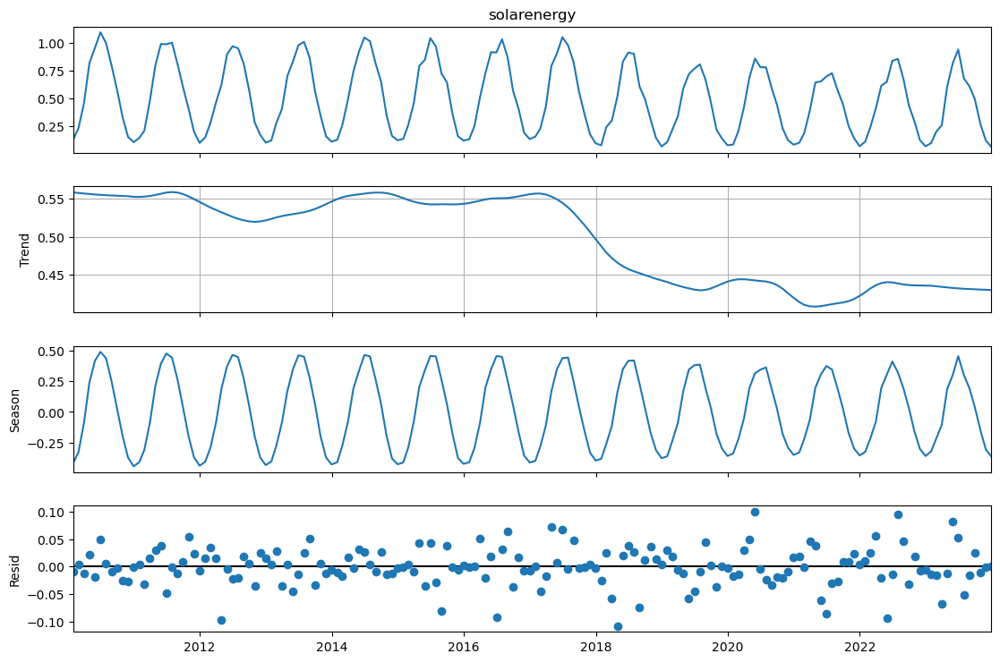

In [24]:
# decomposition on the resampled dataset
decomposition = STL(data_ds_se.loc['2010':'2023', 'solarenergy']).fit()
fig = decomposition.plot()
fig.set_size_inches(12,8)
fig.axes[1].grid()

solarenergy follows seasonal graph and the residual is no more than 1 degree , making the pattern more uniform.

In [25]:
# Time series decomposition for windspeed
data_ds_ws = df['windspeed'].resample('M').mean().ffill().to_frame()
data_ds_ws

,windspeed
2010-01-31,13.873118
2010-02-28,16.492846
2010-03-31,16.169824
2010-04-30,14.993472
2010-05-31,13.314266
...,...
2023-09-30,14.488456
2023-10-31,14.797574
2023-11-30,16.932222
2023-12-31,20.360377


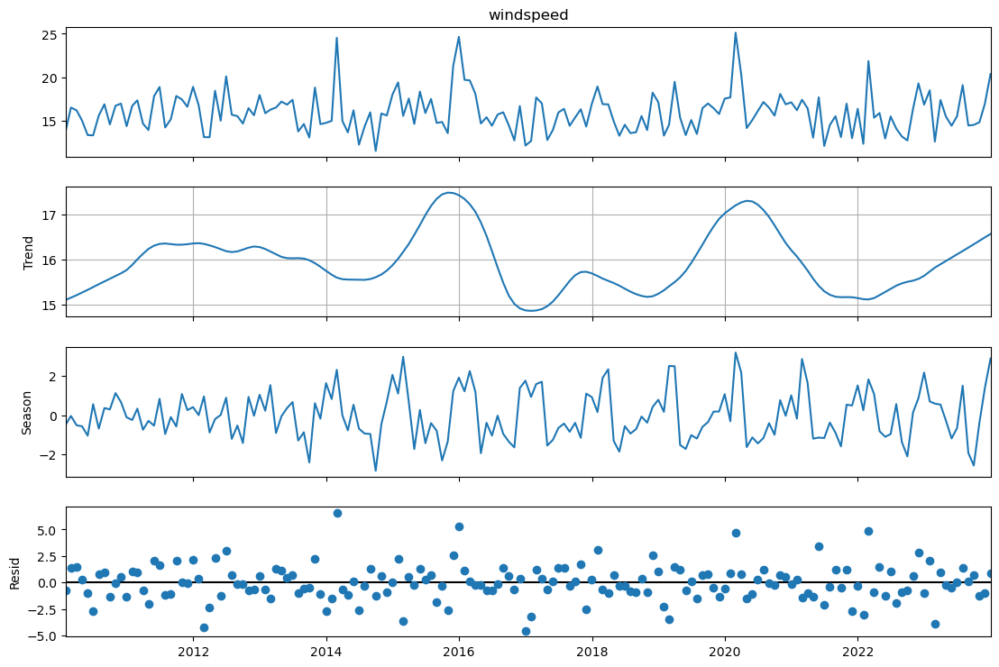

In [26]:
# decomposition on the resampled dataset
decomposition = STL(data_ds_ws.loc['2010':'2023', 'windspeed']).fit()
fig = decomposition.plot()
fig.set_size_inches(12,8)
fig.axes[1].grid()

for windspeed there isn't a clear trend ,values are slightly higher on the right side than on the left
it looks more like white noise however there might be seasonal component to it.

In [27]:
# ADF statistical test for solarenergy
adf_result = adfuller(data_ds_se['solarenergy'])
print('ADF Statistic %.2f:' % adf_result[0])
print('ADF p-value: %.4f:' % adf_result[1])


ADF Statistic -0.82:
ADF p-value: 0.8138:


In [28]:
# ADF statistical test for windspeed
adf_result = adfuller(data_ds_ws['windspeed'])
print('ADF Statistic %.2f:' % adf_result[0])
print('ADF p-value: %.4f:' % adf_result[1])


ADF Statistic -10.84:
ADF p-value: 0.0000:


for solarenergy, as p >0.05,  we fail to reject that the data is non stationary,implying solarenergy seems to vary with time. 
for windspeed, the timeseries is stationary (not time dependent)

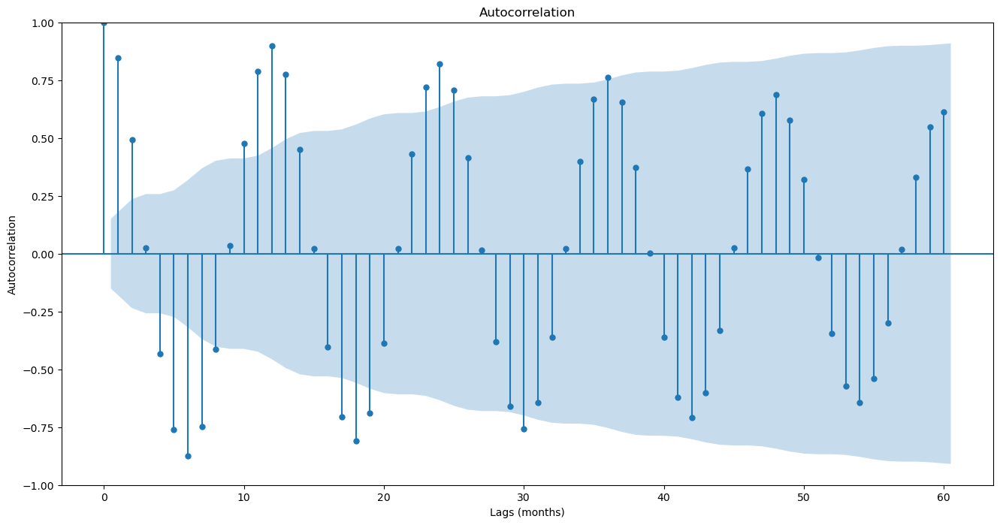

In [29]:
# Autocorrelation to understand variation with lags for solarenergy
fig, ax = plt.subplots(figsize=(16,8))
_=plot_acf(data_ds_se['solarenergy'], lags=60, ax=ax)
_=plt.xlabel('Lags (months)')
_=plt.ylabel('Autocorrelation')
_=plt.savefig('autocorrelation_se.pdf', dpi=500)

High correlation can be seen in solarenergy which makes it easier for us to predict future values based on past inputs.
the ACF is decaying as the time difference grows implying that our process is more likely an auto regressive one.

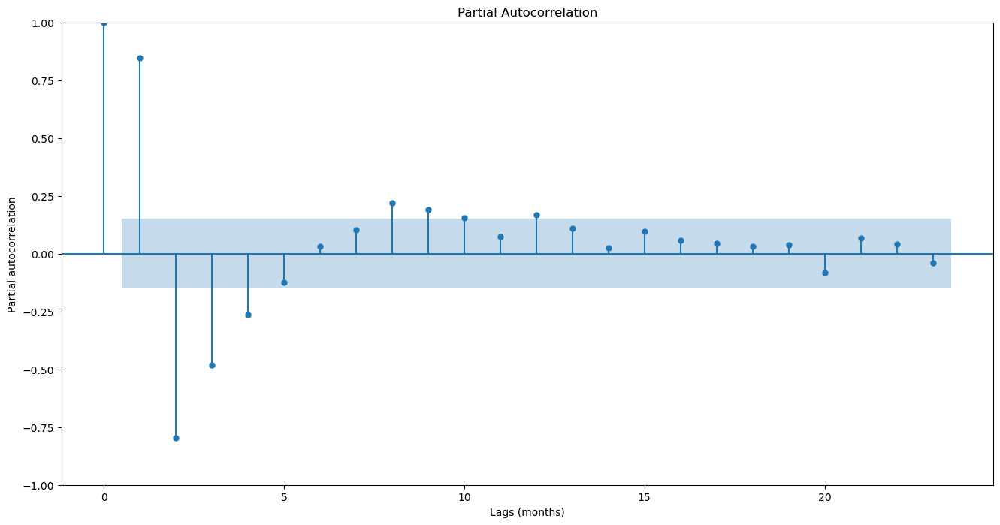

In [30]:
# Partial autocorrelation
fig, ax = plt.subplots(figsize=(16,8))
_=plot_pacf(data_ds_se['solarenergy'], ax=ax)
_=plt.xlabel('Lags (months)')
_=plt.ylabel('Partial autocorrelation')
_=plt.savefig('pacf_se.pdf', dpi=500)


According to pacf, good values for lag as starting point could be 1,2,3,4 as with these lags the correlation we get seems high

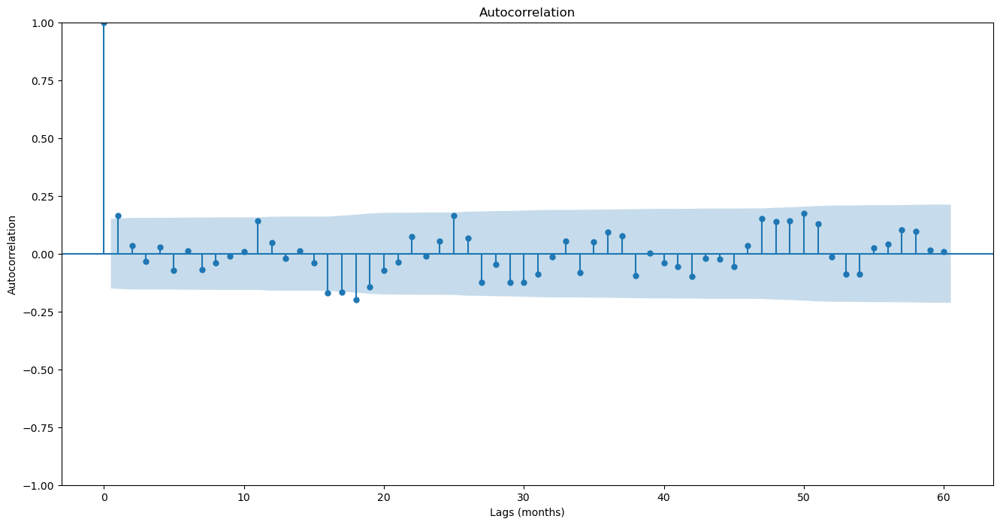

In [31]:
# looking at ACF and PACF for Windspeed
fig, ax = plt.subplots(figsize=(16,8))
_=plot_acf(data_ds_ws['windspeed'], lags=60, ax=ax)
_=plt.xlabel('Lags (months)')
_=plt.ylabel('Autocorrelation')
_=plt.savefig('autocorrelation_ws.pdf', dpi=500)

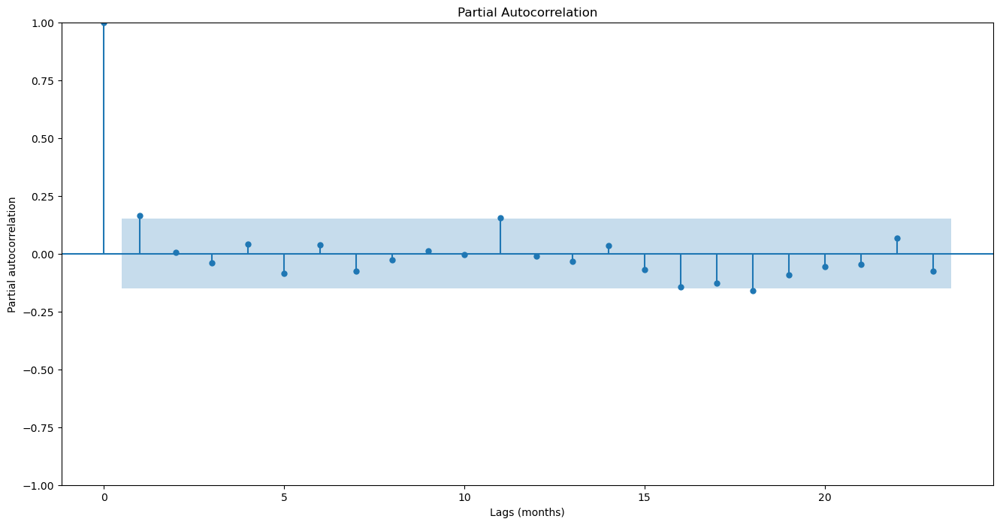

In [32]:
fig, ax = plt.subplots(figsize=(16,8))
_=plot_pacf(data_ds_ws['windspeed'], ax=ax)
_=plt.xlabel('Lags (months)')
_=plt.ylabel('Partial autocorrelation')
_=plt.savefig('pacf_ws.pdf', dpi=500)


We can't say much about Windspeed using above plots as there is not strong correlations

# Data Split

In [33]:
# Creating training and test splits
date_split ='2023-01-01'
train_data=df[df.index < '2022-01-01']
test_data=df[df.index >= date_split]
val_data=df[(df.index >= '2022-01-01') & (df.index < date_split)]

# Data Cleaning

In [34]:
df.isnull().sum()

temp                   268
dew                    290
humidity               283
precip                 293
precipprob             300
preciptype          111569
snow                 33044
snowdepth            33575
windspeed              275
winddir                291
sealevelpressure       539
cloudcover             302
solarradiation         344
solarenergy            378
uvindex                372
year                    14
month                   14
day                     14
hour                    14
week_of_year            14
dtype: int64

In [35]:
df[df['solarenergy'].sort_index().isnull()==True].head()

,temp,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windspeed,winddir,sealevelpressure,cloudcover,solarradiation,solarenergy,uvindex,year,month,day,hour,week_of_year
2010-01-24 03:00:00,3.8,2.5,91.33,0.0,0.0,NaN,0.0,0.0,9.7,345.0,1022.0,100.0,0.0,NaN,0.0,2010,1,24,3,3
2010-02-05 23:00:00,6.8,5.7,92.55,0.0,0.0,NaN,0.0,0.0,12.4,124.0,1002.7,18.1,0.0,NaN,0.0,2010,2,5,23,5
2010-03-10 05:00:00,2.4,-0.5,81.29,0.0,0.0,NaN,0.0,0.0,19.1,33.0,1028.2,100.0,0.0,NaN,0.0,2010,3,10,5,10
2010-03-16 04:00:00,2.1,-0.9,80.92,0.0,0.0,NaN,0.0,0.0,5.5,322.0,1026.4,80.0,0.0,NaN,0.0,2010,3,16,4,11
2010-03-28 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>


missing values are not consecutive

In [36]:
# checking to see best interpolation method to fill our data
df[(df['solarenergy'].isnull()) & (df.index.hour >= 00) & (df.index.hour <= 16)].index 
# applying the hour filter because the solarenergy reaches maximum and then decreases in this period as noticed above


DatetimeIndex(['2010-01-24 03:00:00', '2010-03-10 05:00:00',
               '2010-03-16 04:00:00', '2010-03-28 01:00:00',
               '2010-05-07 16:00:00', '2010-05-13 07:00:00',
               '2010-06-05 14:00:00', '2010-06-10 12:00:00',
               '2010-08-12 01:00:00', '2010-08-30 15:00:00',
               ...
               '2023-09-28 16:00:00', '2023-10-05 08:00:00',
               '2023-10-18 08:00:00', '2023-10-24 16:00:00',
               '2023-11-16 06:00:00', '2023-12-04 05:00:00',
               '2023-12-04 07:00:00', '2023-12-09 15:00:00',
               '2024-01-02 00:00:00', '2024-01-04 10:00:00'],
              dtype='datetime64[ns]', length=282, freq=None)

<Axes: >

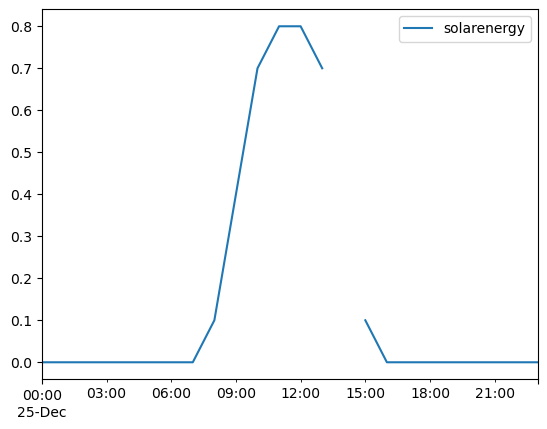

In [37]:
df.loc['2010-12-25':'2010-12-25',df.columns=='solarenergy'].plot()

In [38]:
df2 = df.loc['2010-12-25':'2010-12-25',df.columns=='solarenergy'].copy()

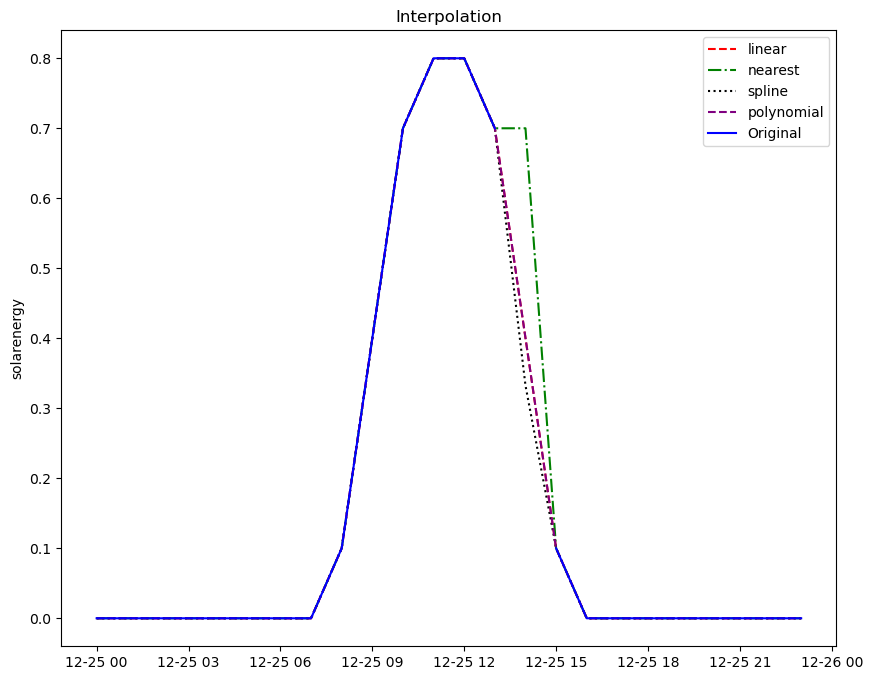

In [39]:
df2['linear_interp'] = df2['solarenergy'].interpolate(method='linear')
df2['nearest_interp'] = df2['solarenergy'].interpolate(method='nearest')
df2['spline_interp'] = df2['solarenergy'].interpolate(method='spline', order=2)
df2['polynomial_interp'] = df2['solarenergy'].interpolate(method="polynomial", order=3)

# df2.plot(figsize=(10, 6))
fig, ax = plt.subplots(figsize=(10,8))

plt.plot(df2.index, df2['linear_interp'], linestyle='--', color='red', label='linear')
plt.plot(df2.index, df2['nearest_interp'], linestyle='-.', color='green', label='nearest')
plt.plot(df2.index, df2['spline_interp'], linestyle=':', color='black', label='spline')
plt.plot(df2.index, df2['polynomial_interp'], linestyle='--', color='purple', label='polynomial')
plt.plot(df2.index, df2['solarenergy'], label='Original', color='blue')

plt.legend()
plt.ylabel('solarenergy')

_=plt.title('Interpolation')

polynomial_interpolation seems a fair choice

In [40]:
df['solarenergy'] = df['solarenergy'].interpolate(method="polynomial", order=3)
df['solarenergy'].isnull().sum()
# applying polynomial interpolation on all the data splits

0

In [41]:
train_data['solarenergy'] = train_data['solarenergy'].interpolate(method="polynomial", order=3)
train_data['solarenergy'].isnull().sum()


0

In [42]:
val_data['solarenergy'] = val_data['solarenergy'].interpolate(method="polynomial", order=3)
val_data['solarenergy'].isnull().sum()


0

In [43]:
test_data['solarenergy'] = test_data['solarenergy'].interpolate(method="polynomial", order=3)
test_data['solarenergy'].isnull().sum()

0

In [44]:

pyo.init_notebook_mode()
fig = px.line(df,x=df.index,y='solarenergy',title='solar energy after filling data')
fig.update_xaxes(range=['2010-12-24', '2010-12-30'],rangeslider_visible=True)
pio.renderers.default = 'iframe'
fig.show()
fig.write_html("se_after_cleaning.html")

In [45]:
#filling values for windspeed

df[df['windspeed'].isnull()==True].head() # again nulls are at random datetime


,temp,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windspeed,winddir,sealevelpressure,cloudcover,solarradiation,solarenergy,uvindex,year,month,day,hour,week_of_year
2010-02-20 02:00:00,-0.4,-1.0,95.64,0.0,0.0,NaN,0.0,0.0,NaN,275.0,997.3,41.4,0.0,0.0,0.0,2010,2,20,2,7
2010-03-13 02:00:00,4.7,3.5,91.53,0.0,0.0,NaN,0.0,0.0,NaN,9.0,1027.6,50.2,0.0,0.0,0.0,2010,3,13,2,10
2010-03-16 03:00:00,1.9,-0.4,84.81,0.0,0.0,NaN,0.0,0.0,NaN,339.0,1026.5,10.0,0.0,0.0,0.0,2010,3,16,3,11
2010-03-20 23:00:00,7.7,7.7,99.70,0.0,0.0,NaN,0.0,0.0,NaN,250.0,1005.6,74.0,0.0,0.0,0.0,2010,3,20,23,11
2010-03-25 19:00:00,8.6,7.8,94.38,0.0,0.0,NaN,0.0,0.0,NaN,203.0,998.7,10.0,0.0,0.0,0.0,2010,3,25,19,12


In [46]:
# checking to see best interpolation method to fill our data
df[(df['windspeed'].isnull())].index 


DatetimeIndex(['2010-02-20 02:00:00', '2010-03-13 02:00:00',
               '2010-03-16 03:00:00', '2010-03-20 23:00:00',
               '2010-03-25 19:00:00', '2010-03-28 01:00:00',
               '2010-05-17 20:00:00', '2010-06-10 16:00:00',
               '2010-06-19 17:00:00', '2010-07-18 04:00:00',
               ...
               '2023-08-08 16:00:00', '2023-08-10 19:00:00',
               '2023-08-19 14:00:00', '2023-08-28 00:00:00',
               '2023-09-15 02:00:00', '2023-10-23 15:00:00',
               '2023-10-27 09:00:00', '2023-12-22 06:00:00',
               '2023-12-27 03:00:00', '2024-01-03 10:00:00'],
              dtype='datetime64[ns]', length=275, freq=None)

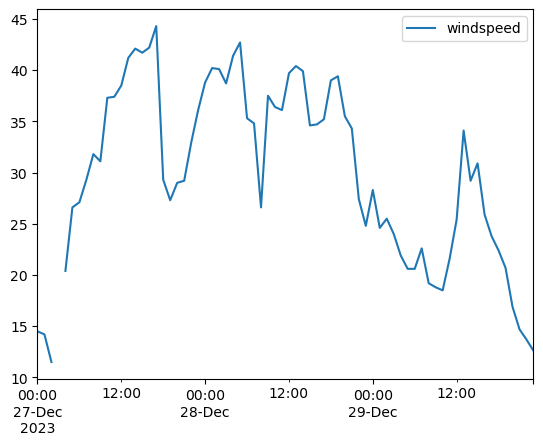

In [47]:
df.loc['2023-12-27':'2023-12-29',df.columns=='windspeed'].plot()
df2 = df.loc['2023-12-27':'2023-12-29',df.columns=='windspeed'].copy()

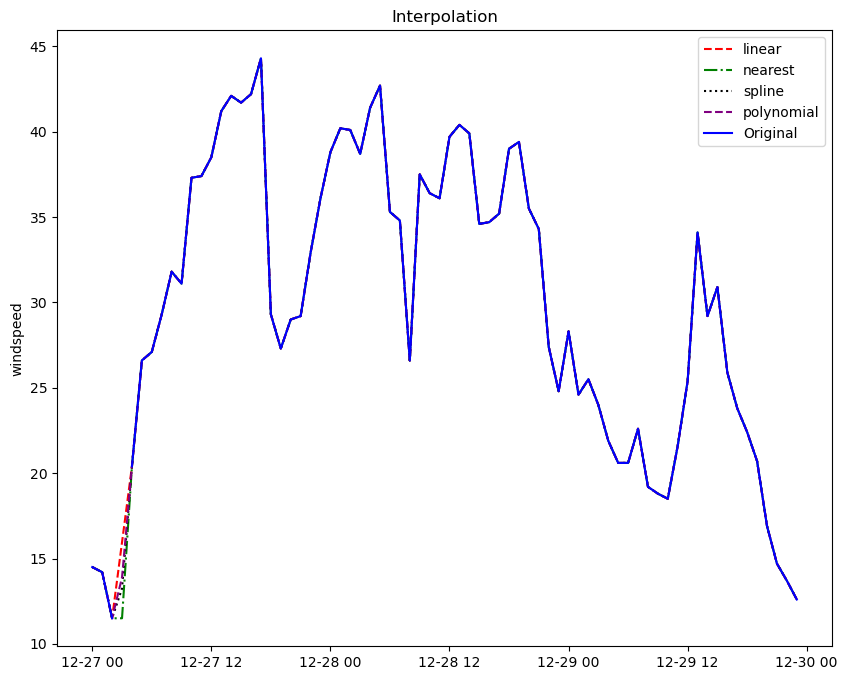

In [48]:
df2['linear_interp'] = df2['windspeed'].interpolate(method='linear')
df2['nearest_interp'] = df2['windspeed'].interpolate(method='nearest')
df2['spline_interp'] = df2['windspeed'].interpolate(method='spline', order=2)
df2['polynomial_interp'] = df2['windspeed'].interpolate(method="polynomial", order=3)

# df2.plot(figsize=(10, 6))
fig, ax = plt.subplots(figsize=(10,8))

plt.plot(df2.index, df2['linear_interp'], linestyle='--', color='red', label='linear')
plt.plot(df2.index, df2['nearest_interp'], linestyle='-.', color='green', label='nearest')
plt.plot(df2.index, df2['spline_interp'], linestyle=':', color='black', label='spline')
plt.plot(df2.index, df2['polynomial_interp'], linestyle='--', color='purple', label='polynomial')
plt.plot(df2.index, df2['windspeed'], label='Original', color='blue')

plt.legend()
plt.ylabel('windspeed')

_=plt.title('Interpolation')

In [49]:
# linear seems like the best choice here
df['windspeed'] = df['windspeed'].interpolate(method='linear')
df['windspeed'].isnull().sum()
#applying the same on all data splits

0

In [50]:
train_data['windspeed'] = train_data['windspeed'].interpolate(method='linear')
train_data['windspeed'].isnull().sum()

0

In [51]:
val_data['windspeed'] = val_data['windspeed'].interpolate(method='linear')
val_data['windspeed'].isnull().sum()

0

In [52]:
test_data['windspeed'] = test_data['windspeed'].interpolate(method='linear')
test_data['windspeed'].isnull().sum()

0

In [53]:
# checking complete series after filling data 
pyo.init_notebook_mode()
fig = px.line(df,x=df.index,y='windspeed',title='windspeed after filling data')
fig.update_xaxes(range=['2023-12-23','2023-12-29'],rangeslider_visible=True)
pio.renderers.default = 'iframe'
fig.show()
fig.write_html("ws_after_cleaning.html")

In [54]:
# filling for rest of the nulls in df
# df[df['preciptype'].isnull()==True].head() 
df.loc[df['preciptype'].isnull(), 'precip'].unique()


array([ 0., nan])

In [55]:

# filling null values of preciptype with na, where na represents not applicable as precip is seen to be 0 in such cases
def data_filling(x):
    x['preciptype'].fillna('na', inplace=True)
    x['month'] = x.index.month
    x['year'] = x.index.year
    x['week_of_year'] = x.index.isocalendar().week
    x['day'] = x.index.day
    x['hour'] = x.index.hour
    
    x = x.ffill()  # forward fill
    x = x.bfill()  # backward fill (in case the first value is empty)
    return x
df = data_filling(df)

print(df.isna().sum()) 
df.head()

temp                0
dew                 0
humidity            0
precip              0
precipprob          0
preciptype          0
snow                0
snowdepth           0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
solarradiation      0
solarenergy         0
uvindex             0
year                0
month               0
day                 0
hour                0
week_of_year        0
dtype: int64


,temp,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windspeed,winddir,sealevelpressure,cloudcover,solarradiation,solarenergy,uvindex,year,month,day,hour,week_of_year
2010-01-01 00:00:00,1.9,-0.5,84.25,0.417,100.0,"rain,snow",0.0,0.0,19.4,11.0,999.9,62.2,0.0,0.0,0.0,2010,1,1,0,53
2010-01-01 01:00:00,1.9,-0.5,83.90,0.000,0.0,na,0.0,0.0,21.8,19.0,999.8,22.4,0.0,0.0,0.0,2010,1,1,1,53
2010-01-01 02:00:00,1.4,-0.7,85.76,0.000,0.0,na,0.0,0.0,17.7,10.0,1000.0,38.0,0.0,0.0,0.0,2010,1,1,2,53
2010-01-01 03:00:00,1.4,-0.7,85.69,0.000,0.0,na,0.0,0.0,18.0,11.0,1000.2,66.7,0.0,0.0,0.0,2010,1,1,3,53
2010-01-01 04:00:00,1.3,-0.8,85.72,0.000,0.0,na,0.0,0.0,17.4,10.0,1000.5,62.8,0.0,0.0,0.0,2010,1,1,4,53


our data looks clean and free of nulls, now doing the same for all data splits

In [56]:
train_data = data_filling(train_data)

print(train_data.isna().sum()) 
train_data.head()

temp                0
dew                 0
humidity            0
precip              0
precipprob          0
preciptype          0
snow                0
snowdepth           0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
solarradiation      0
solarenergy         0
uvindex             0
year                0
month               0
day                 0
hour                0
week_of_year        0
dtype: int64


,temp,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windspeed,winddir,sealevelpressure,cloudcover,solarradiation,solarenergy,uvindex,year,month,day,hour,week_of_year
2010-01-01 00:00:00,1.9,-0.5,84.25,0.417,100.0,"rain,snow",0.0,0.0,19.4,11.0,999.9,62.2,0.0,0.0,0.0,2010,1,1,0,53
2010-01-01 01:00:00,1.9,-0.5,83.90,0.000,0.0,na,0.0,0.0,21.8,19.0,999.8,22.4,0.0,0.0,0.0,2010,1,1,1,53
2010-01-01 02:00:00,1.4,-0.7,85.76,0.000,0.0,na,0.0,0.0,17.7,10.0,1000.0,38.0,0.0,0.0,0.0,2010,1,1,2,53
2010-01-01 03:00:00,1.4,-0.7,85.69,0.000,0.0,na,0.0,0.0,18.0,11.0,1000.2,66.7,0.0,0.0,0.0,2010,1,1,3,53
2010-01-01 04:00:00,1.3,-0.8,85.72,0.000,0.0,na,0.0,0.0,17.4,10.0,1000.5,62.8,0.0,0.0,0.0,2010,1,1,4,53


In [57]:
val_data = data_filling(val_data)

print(val_data.isna().sum()) 
val_data.head()

temp                0
dew                 0
humidity            0
precip              0
precipprob          0
preciptype          0
snow                0
snowdepth           0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
solarradiation      0
solarenergy         0
uvindex             0
year                0
month               0
day                 0
hour                0
week_of_year        0
dtype: int64


,temp,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windspeed,winddir,sealevelpressure,cloudcover,solarradiation,solarenergy,uvindex,year,month,day,hour,week_of_year
2022-01-01 00:00:00,12.0,11.6,97.51,0.015,100.0,rain,0.0,0.0,14.4,193.0,1021.6,99.2,0.0,0.0,0.0,2022,1,1,0,52
2022-01-01 01:00:00,12.2,11.7,96.90,0.000,0.0,na,0.0,0.0,16.8,209.0,1021.3,100.0,0.0,0.0,0.0,2022,1,1,1,52
2022-01-01 02:00:00,11.8,11.6,98.70,0.000,0.0,na,0.0,0.0,12.9,211.0,1021.4,100.0,0.0,0.0,0.0,2022,1,1,2,52
2022-01-01 03:00:00,11.8,11.5,98.43,0.000,0.0,na,0.0,0.0,8.6,143.0,1021.5,97.9,0.0,0.0,0.0,2022,1,1,3,52
2022-01-01 04:00:00,11.8,11.4,97.46,0.000,0.0,na,0.0,0.0,9.3,164.0,1021.2,99.2,0.0,0.0,0.0,2022,1,1,4,52


In [58]:
test_data = data_filling(test_data)

print(test_data.isna().sum()) 
test_data.head()

temp                0
dew                 0
humidity            0
precip              0
precipprob          0
preciptype          0
snow                0
snowdepth           0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
solarradiation      0
solarenergy         0
uvindex             0
year                0
month               0
day                 0
hour                0
week_of_year        0
dtype: int64


,temp,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windspeed,winddir,sealevelpressure,cloudcover,solarradiation,solarenergy,uvindex,year,month,day,hour,week_of_year
2023-01-01 00:00:00,11.4,10.6,95.05,4.733,100.0,rain,0.0,0.0,33.0,231.0,1005.4,94.1,0.0,0.0,0.0,2023,1,1,0,52
2023-01-01 01:00:00,10.9,10.1,94.89,0.263,100.0,rain,0.0,0.0,29.7,230.0,1006.2,91.6,0.0,0.0,0.0,2023,1,1,1,52
2023-01-01 02:00:00,10.8,8.9,87.93,0.000,0.0,na,0.0,0.0,29.6,229.0,1006.8,84.8,0.0,0.0,0.0,2023,1,1,2,52
2023-01-01 03:00:00,10.8,9.1,89.42,0.000,0.0,na,0.0,0.0,26.4,222.0,1007.6,79.2,0.0,0.0,0.0,2023,1,1,3,52
2023-01-01 04:00:00,11.0,9.0,87.46,0.000,0.0,na,0.0,0.0,29.0,221.0,1008.1,83.3,0.0,0.0,0.0,2023,1,1,4,52


Data splits looks clean and deviod of nulls.

In [59]:
#saving data
df.to_csv('aggregated_data.csv')
train_data.to_csv('train_data.csv')
val_data.to_csv('val_data.csv')
test_data.to_csv('test_data.csv')